In [1]:
# import libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
%matplotlib inline

from scipy.misc.pilutil import imread

deaths = pd.concat([pd.read_csv("./pubg-match-deaths/deaths/kill_match_stats_final_0.csv"),
                   pd.read_csv("./pubg-match-deaths/deaths/kill_match_stats_final_1.csv"),
                   pd.read_csv("./pubg-match-deaths/deaths/kill_match_stats_final_2.csv"),
                   pd.read_csv("./pubg-match-deaths/deaths/kill_match_stats_final_3.csv"),
                   pd.read_csv("./pubg-match-deaths/deaths/kill_match_stats_final_4.csv")], ignore_index=True)

In [2]:
meta = pd.concat([pd.read_csv("./pubg-match-deaths/aggregate/agg_match_stats_0.csv"),
                 pd.read_csv("./pubg-match-deaths/aggregate/agg_match_stats_1.csv"),
                 pd.read_csv("./pubg-match-deaths/aggregate/agg_match_stats_2.csv"),
                 pd.read_csv("./pubg-match-deaths/aggregate/agg_match_stats_3.csv"),
                 pd.read_csv("./pubg-match-deaths/aggregate/agg_match_stats_4.csv"),], ignore_index=True)

In [3]:
match_list = meta.loc[meta['party_size'] == 1, 'match_id'].drop_duplicates()
deaths_solo = deaths[deaths['match_id'].isin(match_list.values)]
deaths_solo_er = deaths_solo[deaths_solo['map'] == 'ERANGEL'].dropna()
deaths_solo_mr = deaths_solo[deaths_solo['map'] == 'MIRAMAR'].dropna()

In [4]:
deaths_solo_er.head()

,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y
463,P92,Adlerx,51.0,391919.3,235406.2,ERANGEL,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,425,Sventy21,59.0,392289.6,235706.1
464,AKM,CocaCola01,4.0,347226.7,142356.4,ERANGEL,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,1477,PNW_Franco17,9.0,345692.8,141435.4
465,P18C,jprodigy,85.0,421634.0,324678.9,ERANGEL,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,126,Eagyl,86.0,421077.3,324661.9
467,UMP9,MLBBear,30.0,420148.7,324679.9,ERANGEL,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,263,Hastela,71.0,420297.3,326671.7
468,S686,JackieCOC,5.0,350512.6,403584.0,ERANGEL,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,187,Satch,79.0,350609.2,403244.2


In [49]:
deaths_solo_er_fourmin = deaths_solo_er[deaths_solo_er['time'] < 240]
deaths_solo_mr_fourmin = deaths_solo_mr[deaths_solo_mr['time'] < 240]

In [50]:
plot_data_er_fourmin = np.vstack([deaths_solo_er_fourmin[['victim_position_x', 'victim_position_y']].values, 
                                  deaths_solo_er_fourmin[['killer_position_x', 'killer_position_y']].values])
plot_data_mr_fourmin = np.vstack([deaths_solo_mr_fourmin[['victim_position_x', 'victim_position_y']].values, 
                                  deaths_solo_mr_fourmin[['killer_position_x', 'killer_position_y']].values])

plot_data_er_fourmin = plot_data_er_fourmin*4096/800000
plot_data_mr_fourmin = plot_data_mr_fourmin*1000/800000

/Users/qintaoying/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:12: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  if sys.path[0] == '':


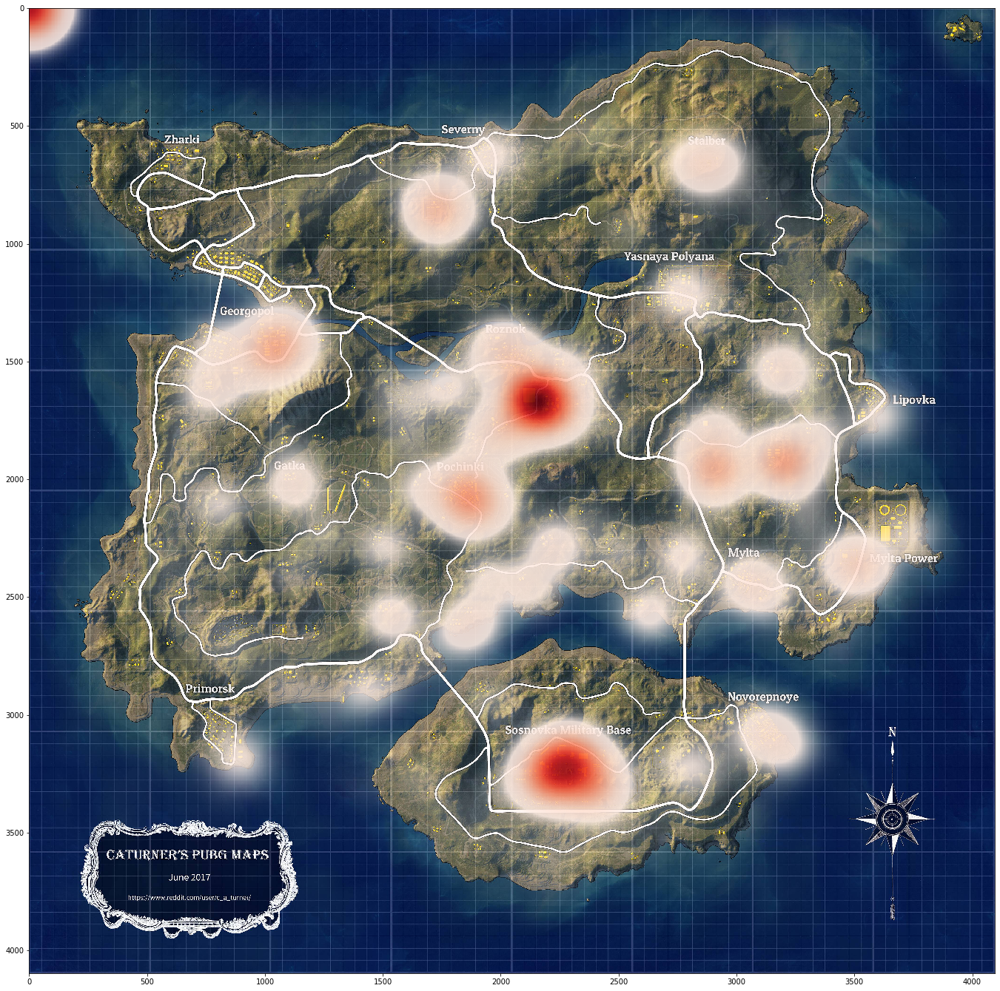

In [51]:
from scipy.ndimage.filters import gaussian_filter
import matplotlib.cm as cm
from matplotlib.colors import Normalize

def heatmap(x, y, s, bins=100):
    heatmap, xedges, yedges = np.histogram2d(x, y, bins=bins)
    heatmap = gaussian_filter(heatmap, sigma=s)

    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
    return heatmap.T, extent

bg = imread('./pubg-match-deaths/erangel.jpg')
hmap, extent = heatmap(plot_data_er_fourmin[:,0], plot_data_er_fourmin[:,1], 20, bins=1000)
alphas = np.clip(Normalize(0, hmap.max(), clip=True)(hmap)*20, 0.0, 1.)
colors = Normalize(0, hmap.max(), clip=True)(hmap)
colors = cm.Reds(colors)
colors[..., -1] = alphas

fig, ax = plt.subplots(figsize=(24,24))
ax.set_xlim(0, 4096); ax.set_ylim(0, 4096)
ax.imshow(bg)
ax.imshow(colors, extent=extent, origin='lower', cmap=cm.Reds, alpha=0.9)
#plt.scatter(plot_data_er[:,0], plot_data_er[:,1])
plt.gca().invert_yaxis()
plt.savefig("heatmap_erangel_fourmin.jpg")

/Users/qintaoying/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


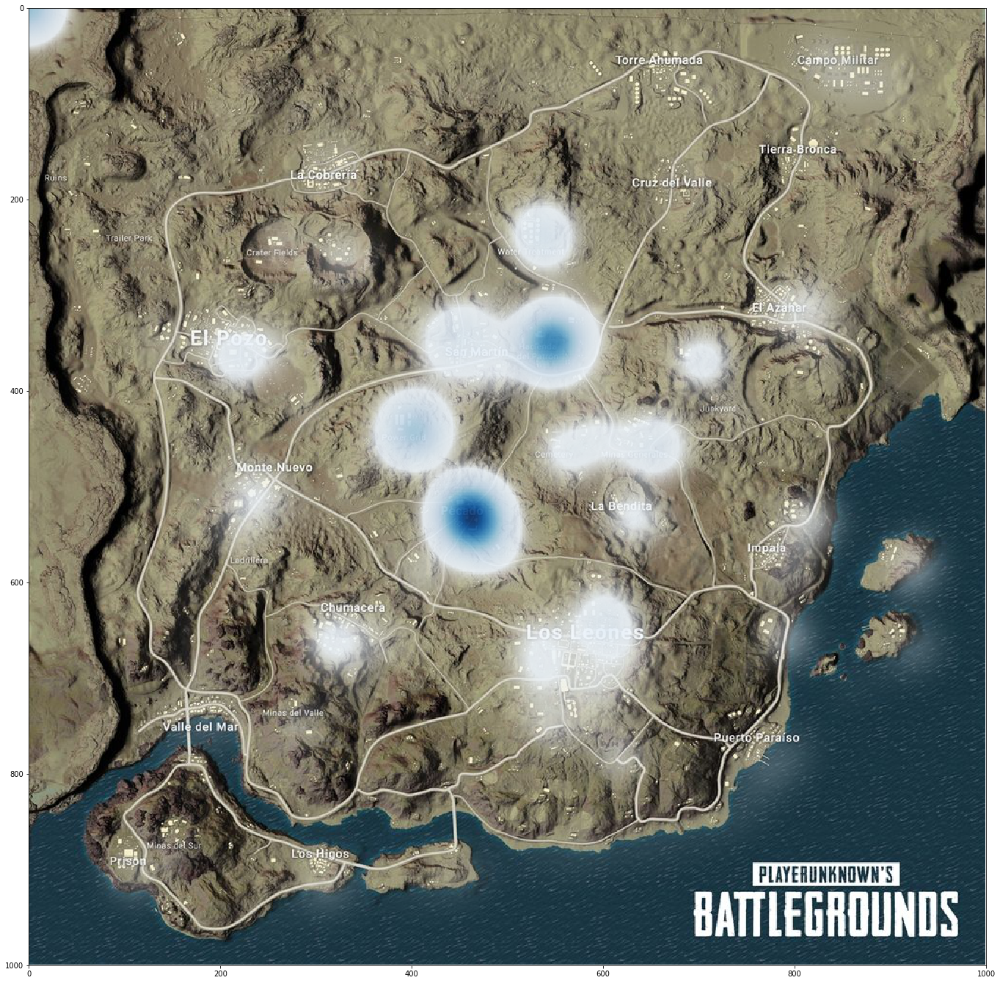

In [53]:
bg = imread('./pubg-match-deaths/miramar.jpg')
hmap, extent = heatmap(plot_data_mr_fourmin[:,0], plot_data_mr_fourmin[:,1], 20, bins=1000)
alphas = np.clip(Normalize(0, hmap.max(), clip=True)(hmap)*20, 0.0, 1.)
colors = Normalize(0, hmap.max(), clip=True)(hmap)
colors = cm.Blues(colors)
colors[..., -1] = alphas

fig, ax = plt.subplots(figsize=(24,24))
ax.set_xlim(0, 1000); ax.set_ylim(0, 1000)
ax.imshow(bg)
ax.imshow(colors, extent=extent, origin='lower', cmap=cm.Blues, alpha=0.9)
#plt.scatter(plot_data_mr[:,0], plot_data_mr[:,1])
plt.gca().invert_yaxis()
plt.savefig("heatmap_miramar_fourmin.jpg")

In [54]:
plot_data_er = np.vstack([deaths_solo_er[['victim_position_x', 'victim_position_y']].values, 
                          deaths_solo_er[['killer_position_x', 'killer_position_y']].values])
plot_data_mr = np.vstack([deaths_solo_mr[['victim_position_x', 'victim_position_y']].values, 
                          deaths_solo_mr[['killer_position_x', 'killer_position_y']].values])

# transcribe location data to image size
plot_data_er = plot_data_er*4096/800000
plot_data_mr = plot_data_mr*1000/800000

/Users/qintaoying/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:12: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  if sys.path[0] == '':


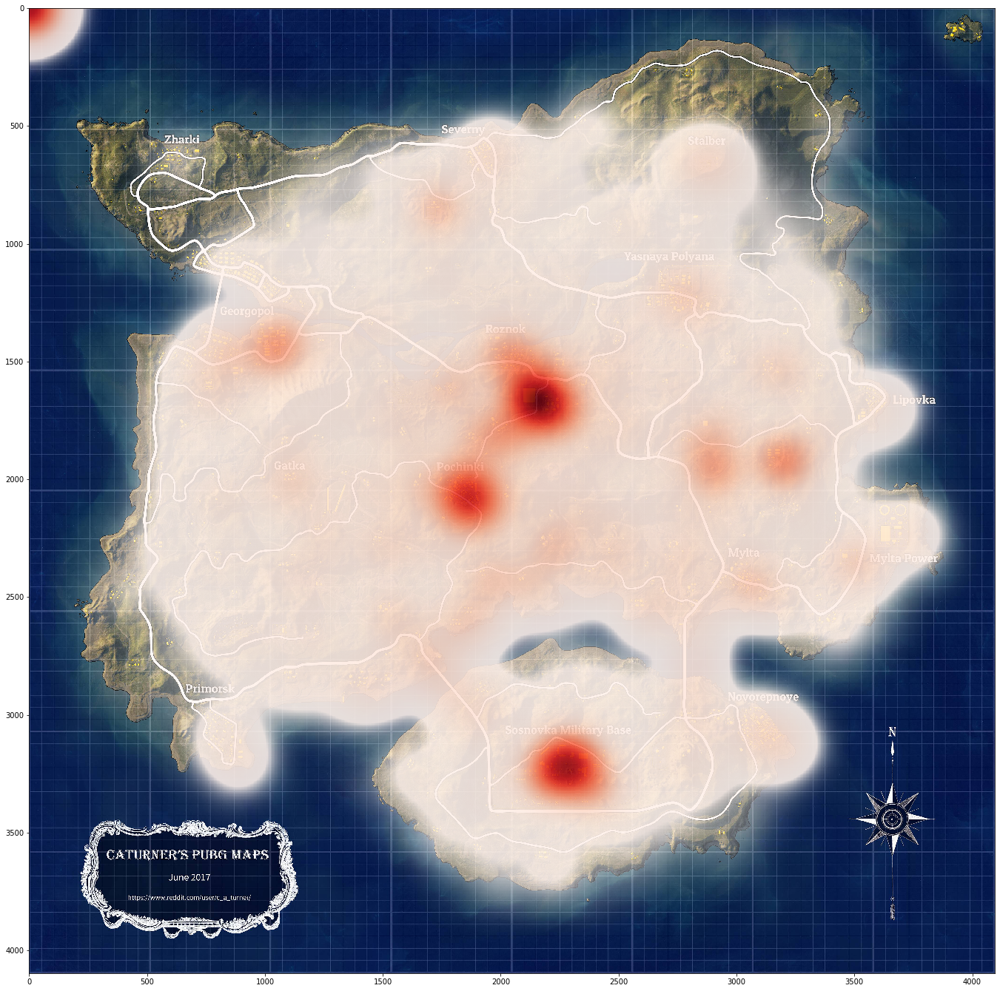

In [55]:
from scipy.ndimage.filters import gaussian_filter
import matplotlib.cm as cm
from matplotlib.colors import Normalize

def heatmap(x, y, s, bins=100):
    heatmap, xedges, yedges = np.histogram2d(x, y, bins=bins)
    heatmap = gaussian_filter(heatmap, sigma=s)

    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
    return heatmap.T, extent

bg = imread('./pubg-match-deaths/erangel.jpg')
hmap, extent = heatmap(plot_data_er[:,0], plot_data_er[:,1], 20, bins=1000)
alphas = np.clip(Normalize(0, hmap.max(), clip=True)(hmap)*50, 0.0, 1.)
colors = Normalize(0, hmap.max(), clip=True)(hmap)
colors = cm.Reds(colors)
colors[..., -1] = alphas

fig, ax = plt.subplots(figsize=(24,24))
ax.set_xlim(0, 4096); ax.set_ylim(0, 4096)
ax.imshow(bg)
ax.imshow(colors, extent=extent, origin='lower', cmap=cm.Reds, alpha=0.9)
#plt.scatter(plot_data_er[:,0], plot_data_er[:,1])
plt.gca().invert_yaxis()
plt.savefig("heatmap_erangel.jpg")

/Users/qintaoying/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


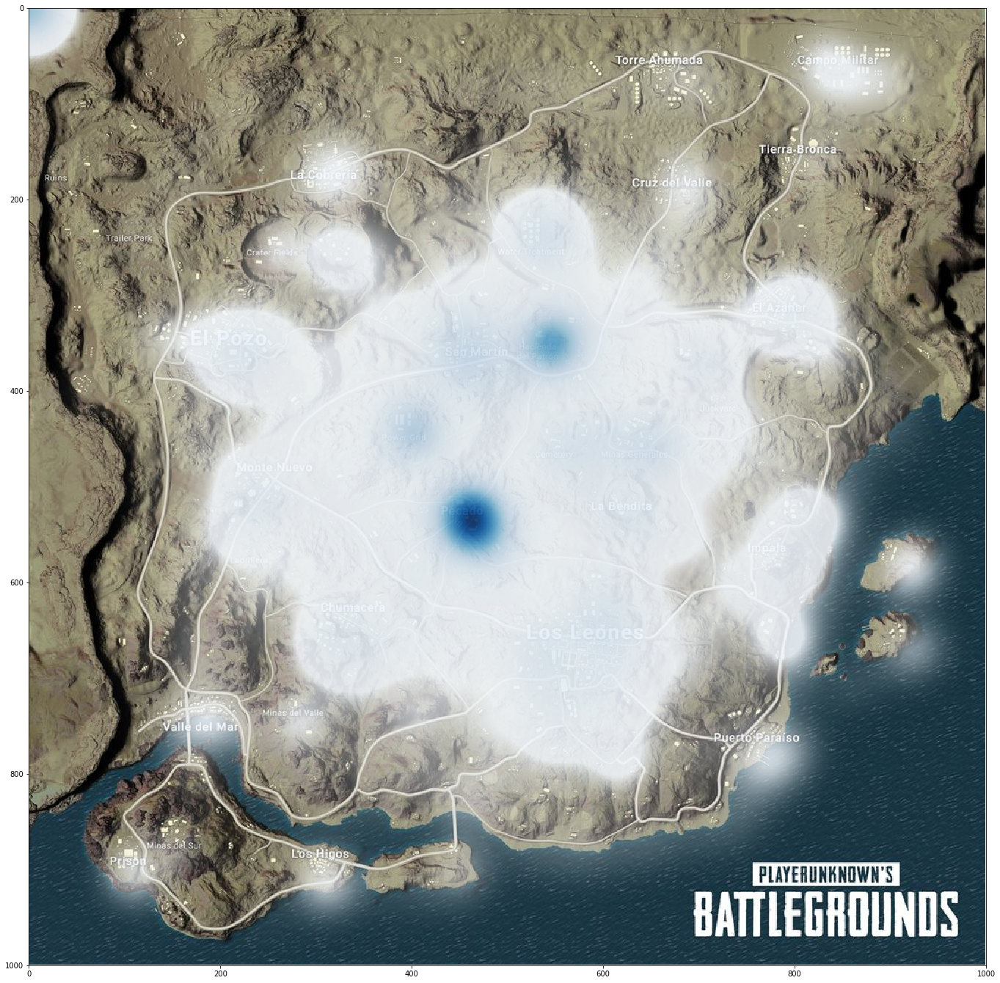

In [56]:
bg = imread('./pubg-match-deaths/miramar.jpg')
hmap, extent = heatmap(plot_data_mr[:,0], plot_data_mr[:,1], 20, bins=1000)
alphas = np.clip(Normalize(0, hmap.max(), clip=True)(hmap)*50, 0.0, 1.)
colors = Normalize(0, hmap.max(), clip=True)(hmap)
colors = cm.Blues(colors)
colors[..., -1] = alphas

fig, ax = plt.subplots(figsize=(24,24))
ax.set_xlim(0, 1000); ax.set_ylim(0, 1000)
ax.imshow(bg)
ax.imshow(colors, extent=extent, origin='lower', cmap=cm.Blues, alpha=0.9)
#plt.scatter(plot_data_mr[:,0], plot_data_mr[:,1])
plt.gca().invert_yaxis()
plt.savefig("heatmap_miramar.jpg")

In [6]:
deaths_solo_er_chicken = deaths_solo_er[deaths_solo_er['killer_placement'] == 1.0]

In [7]:
deaths_solo_er_chicken.head()

,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y
474,M416,sdjdd,1.0,277820.6,181814.6,ERANGEL,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,1273,HORI2MIONE,17.0,277729.9,182195.0
477,Kar98k,sdjdd,1.0,348392.5,121524.5,ERANGEL,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,1636,QcnnAoneQ,7.0,346781.6,129334.6
513,M416,sdjdd,1.0,371433.1,119940.6,ERANGEL,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,1959,anbo1349,2.0,371084.5,120010.0
524,Kar98k,sdjdd,1.0,361472.9,122103.6,ERANGEL,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,1812,CocaCola01,4.0,368707.4,124496.8
529,M416,sdjdd,1.0,371442.1,119882.7,ERANGEL,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,1947,Arnoxiong,3.0,371809.9,120535.5


In [40]:
unique, counts = np.unique(deaths_solo_er_chicken['killed_by'], return_counts = True)
order = np.argsort(counts)
order = np.flip(order)

In [41]:
unique = np.flip(unique[order[0:10]])
counts = np.flip(counts[order[0:10]])
y_pos = np.arange(len(unique))

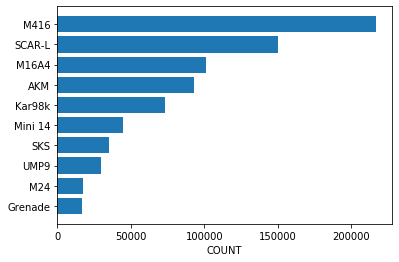

In [44]:
plt.barh(y_pos, counts)
plt.yticks(y_pos, unique)
plt.xlabel('COUNT')
plt.savefig("winner_top_ten_weapon_er.jpg")

In [45]:
deaths_solo_mr_chicken = deaths_solo_mr[deaths_solo_mr['killer_placement'] == 1.0]
unique, counts = np.unique(deaths_solo_mr_chicken['killed_by'], return_counts = True)
order = np.argsort(counts)
order = np.flip(order)

In [46]:
unique = np.flip(unique[order[0:10]])
counts = np.flip(counts[order[0:10]])
y_pos = np.arange(len(unique))

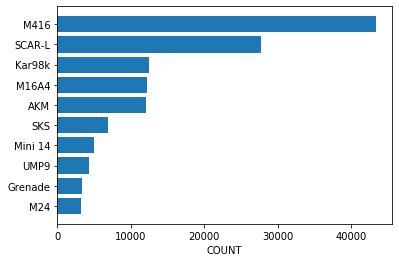

In [47]:
plt.barh(y_pos, counts)
plt.yticks(y_pos, unique)
plt.xlabel('COUNT')
plt.savefig("winner_top_ten_weapon_mr.jpg")